<a href="https://colab.research.google.com/github/saakshigupta2002/biome-project/blob/main/biome_project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
# Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [2]:
# Import necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats

In [3]:
# Set the file path (adjust this to match your file location in Google Drive)
file_path = '/content/drive/MyDrive/Biome_Data.xlsx'

# Load the data
df = pd.read_excel(file_path, parse_dates=['Time'])

# Display basic information about the dataset
print(df.info())
print(df.describe())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32800 entries, 0 to 32799
Data columns (total 11 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   Time          32800 non-null  datetime64[ns]
 1   Sensor ID     32800 non-null  int64         
 2   conductivity  32800 non-null  int64         
 3   humidity      32800 non-null  float64       
 4   nitrogen      32800 non-null  int64         
 5   ph            32800 non-null  float64       
 6   phosphorus    32800 non-null  int64         
 7   potassium     32800 non-null  int64         
 8   salinity      32800 non-null  int64         
 9   tds           32800 non-null  int64         
 10  temperature   32800 non-null  float64       
dtypes: datetime64[ns](1), float64(3), int64(7)
memory usage: 2.8 MB
None
                                Time     Sensor ID  conductivity  \
count                          32800  32800.000000   32800.00000   
mean   2024-06-26 22:14:28.5248

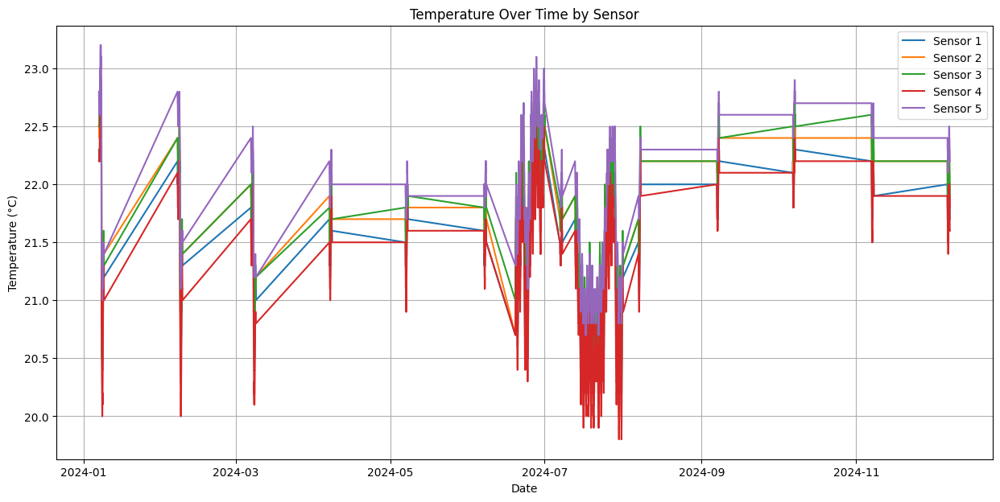

In [4]:
# 1. Temporal Analysis
plt.figure(figsize=(15, 7))
for sensor in df['Sensor ID'].unique():
    sensor_data = df[df['Sensor ID'] == sensor]
    plt.plot(sensor_data['Time'], sensor_data['temperature'], label=f'Sensor {sensor}')

plt.title('Temperature Over Time by Sensor')
plt.xlabel('Date')
plt.ylabel('Temperature (°C)')
plt.legend()
plt.grid(True)
plt.show()

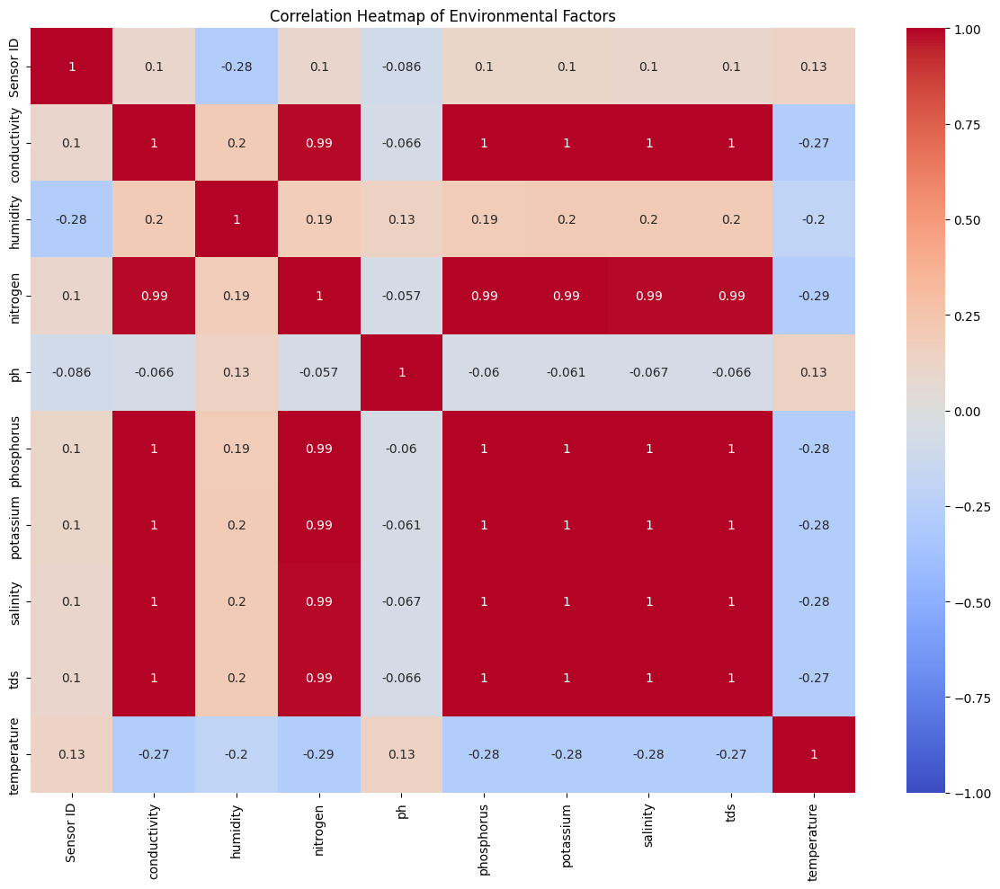

In [5]:
# 2. Correlation Analysis
corr_matrix = df.select_dtypes(include=['float64', 'int64']).corr()

plt.figure(figsize=(12, 10))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', vmin=-1, vmax=1)
plt.title('Correlation Heatmap of Environmental Factors')
plt.tight_layout()
plt.show()

Temperature Anomalies:
Empty DataFrame
Columns: [Time, Sensor ID, temperature]
Index: []


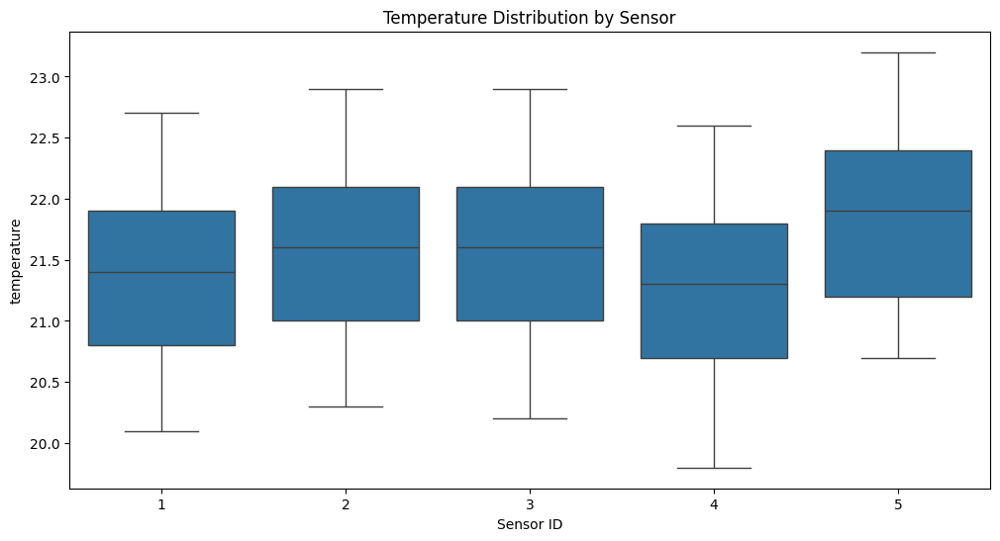

In [6]:
# 3. Anomaly Detection
def detect_anomalies(df, column, threshold=3):
    z_scores = np.abs(stats.zscore(df[column]))
    return df[z_scores > threshold]

temp_anomalies = detect_anomalies(df, 'temperature')
print("Temperature Anomalies:")
print(temp_anomalies[['Time', 'Sensor ID', 'temperature']])

# 4. Sensor Comparison
plt.figure(figsize=(12, 6))
sns.boxplot(x='Sensor ID', y='temperature', data=df)
plt.title('Temperature Distribution by Sensor')
plt.show()

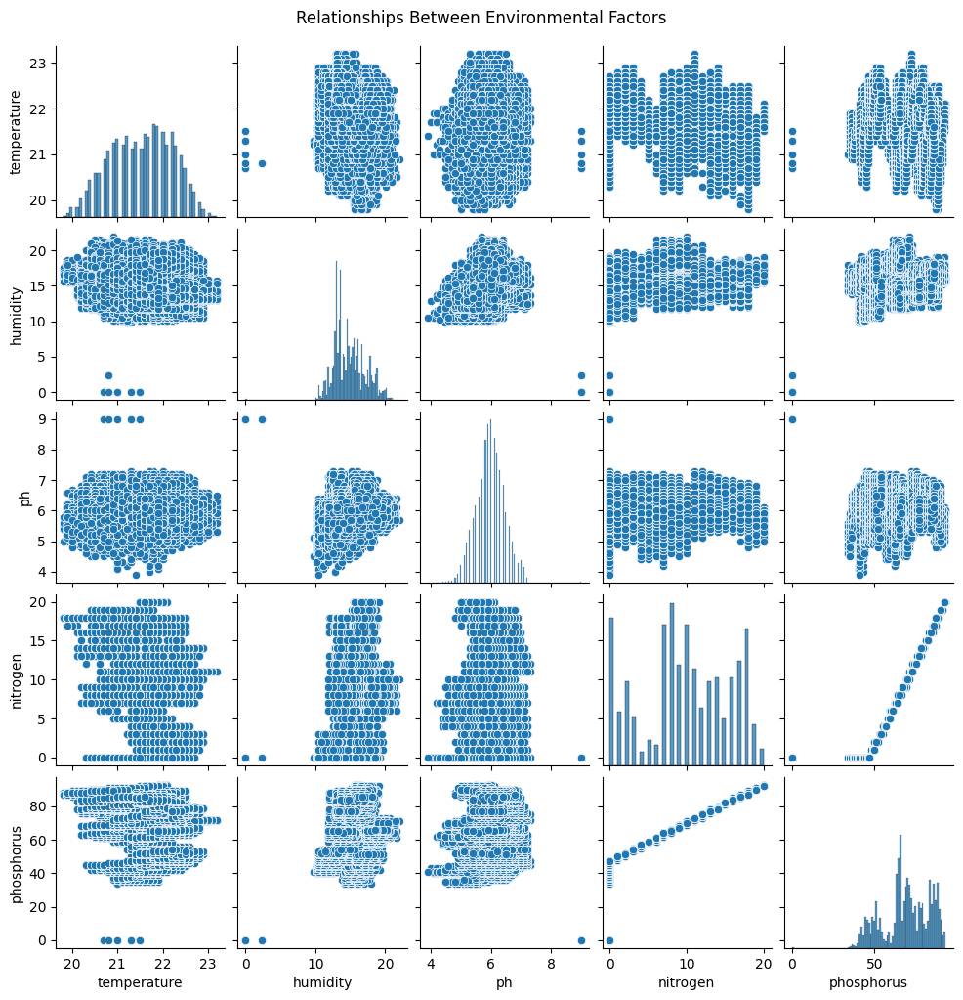

In [7]:
# 5. Environmental Interaction Analysis
sns.pairplot(df[['temperature', 'humidity', 'ph', 'nitrogen', 'phosphorus']], height=2)
plt.suptitle('Relationships Between Environmental Factors', y=1.02)
plt.show()


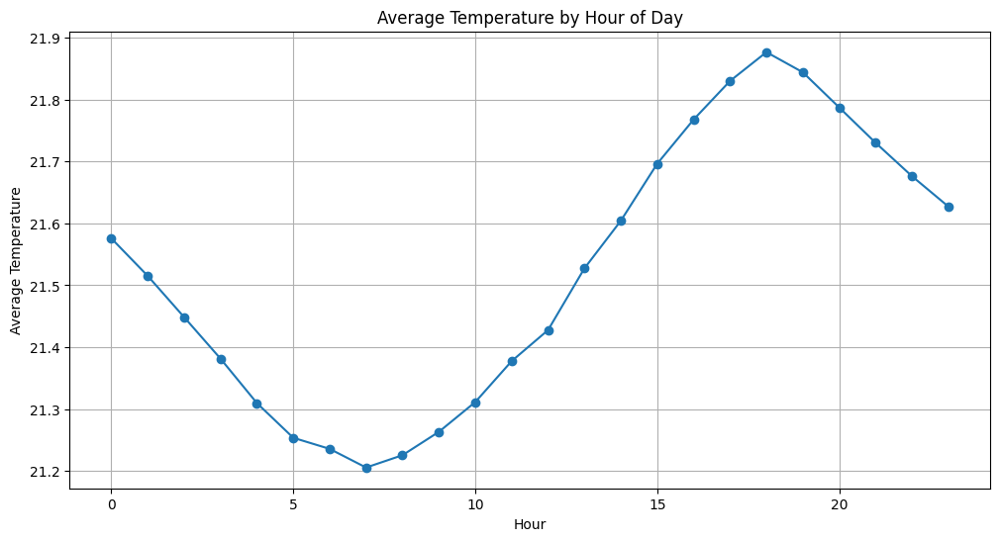

In [8]:
# 6. Time-based Patterns
df['Hour'] = df['Time'].dt.hour
hourly_avg = df.groupby('Hour').mean()

plt.figure(figsize=(12, 6))
plt.plot(hourly_avg.index, hourly_avg['temperature'], marker='o')
plt.title('Average Temperature by Hour of Day')
plt.xlabel('Hour')
plt.ylabel('Average Temperature')
plt.grid(True)
plt.show()


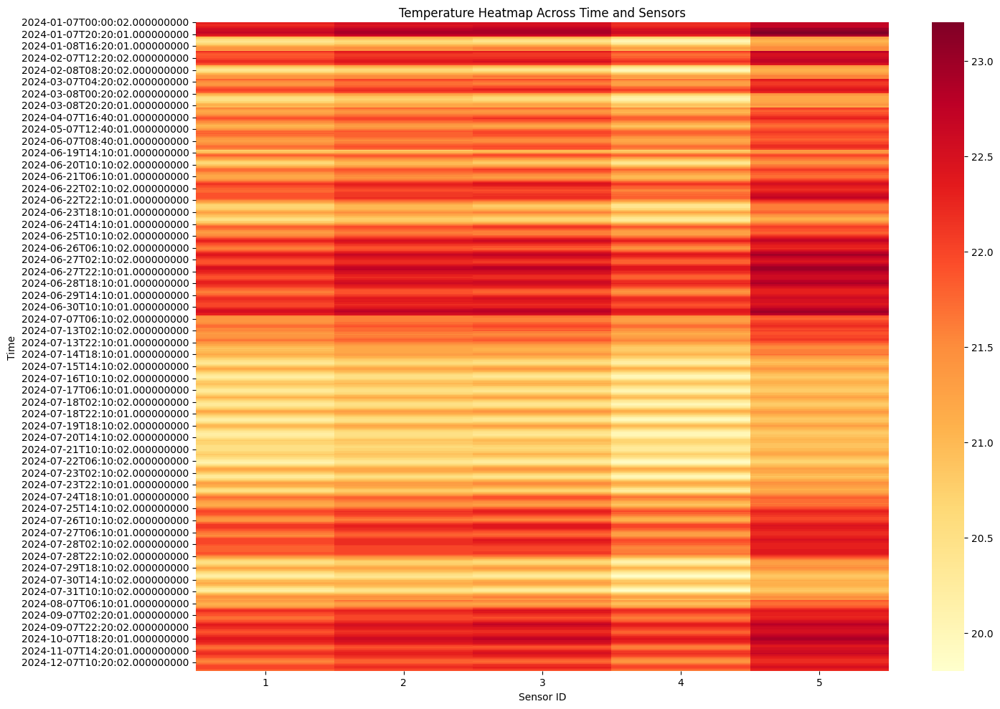

In [9]:
# 7. Heatmap Visualization
pivot_temp = df.pivot(index='Time', columns='Sensor ID', values='temperature')
plt.figure(figsize=(15, 10))
sns.heatmap(pivot_temp, cmap='YlOrRd')
plt.title('Temperature Heatmap Across Time and Sensors')
plt.tight_layout()
plt.show()

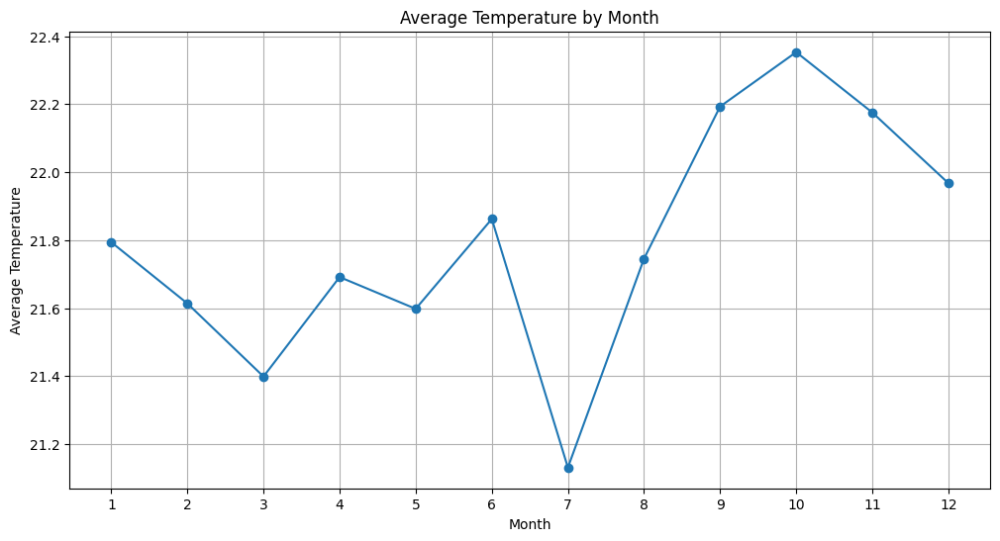

In [10]:
# 8. Seasonal Analysis (if data spans multiple months)
df['Month'] = df['Time'].dt.month
monthly_avg = df.groupby('Month').mean()

plt.figure(figsize=(12, 6))
plt.plot(monthly_avg.index, monthly_avg['temperature'], marker='o')
plt.title('Average Temperature by Month')
plt.xlabel('Month')
plt.ylabel('Average Temperature')
plt.grid(True)
plt.xticks(range(1, 13))
plt.show()

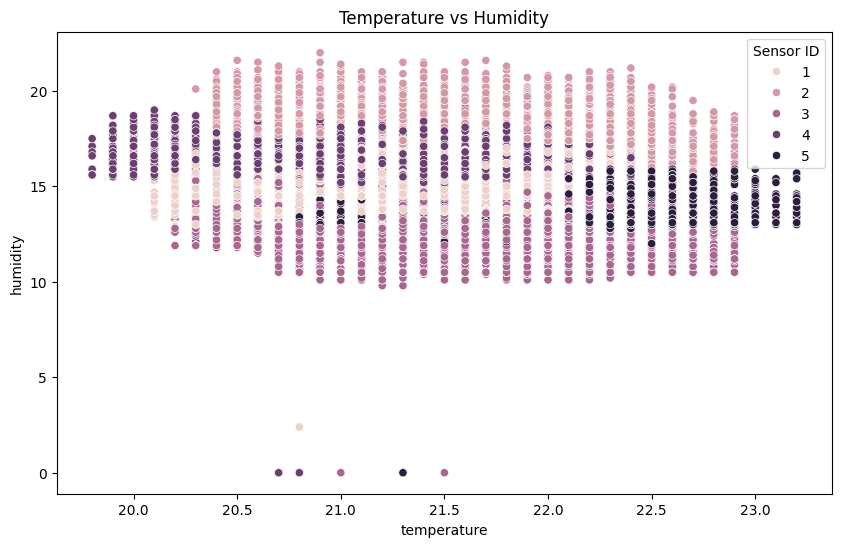

In [11]:
# 9. Correlation between specific variables
plt.figure(figsize=(10, 6))
sns.scatterplot(data=df, x='temperature', y='humidity', hue='Sensor ID')
plt.title('Temperature vs Humidity')
plt.show()

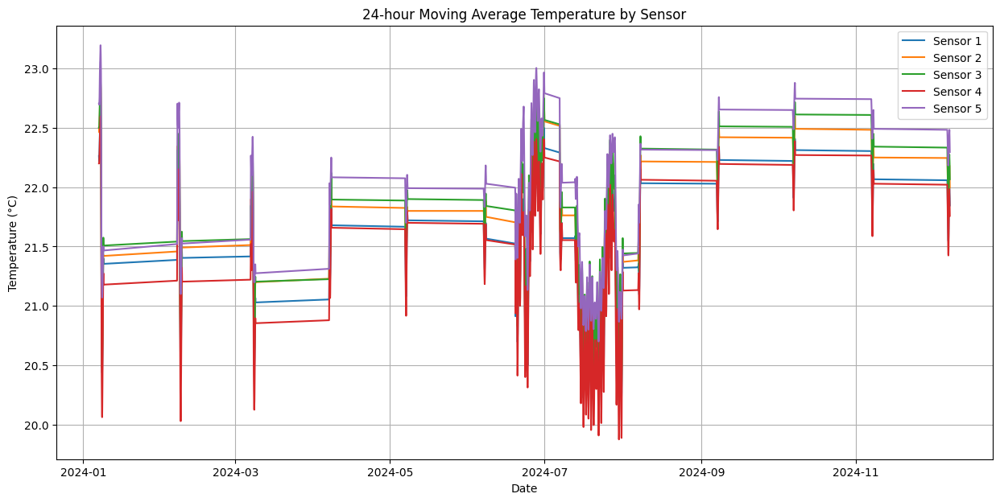

In [12]:
# 10. Moving average to smooth out short-term fluctuations
df['MA_temp'] = df.groupby('Sensor ID')['temperature'].rolling(window=24).mean().reset_index(0, drop=True)

plt.figure(figsize=(15, 7))
for sensor in df['Sensor ID'].unique():
    sensor_data = df[df['Sensor ID'] == sensor]
    plt.plot(sensor_data['Time'], sensor_data['MA_temp'], label=f'Sensor {sensor}')

plt.title('24-hour Moving Average Temperature by Sensor')
plt.xlabel('Date')
plt.ylabel('Temperature (°C)')
plt.legend()
plt.grid(True)
plt.show()

In [14]:
# Import necessary libraries
import pandas as pd
import plotly.graph_objects as go
import plotly.express as px
from plotly.subplots import make_subplots
import numpy as np


# 1. Interactive Time Series for Multiple Parameters
def plot_multi_timeseries(df, sensor_id=1):
    sensor_data = df[df['Sensor ID'] == sensor_id]
    fig = make_subplots(rows=3, cols=1, shared_xaxes=True, vertical_spacing=0.02,
                        subplot_titles=('Temperature', 'Humidity', 'pH'))

    fig.add_trace(go.Scatter(x=sensor_data['Time'], y=sensor_data['temperature'], name='Temperature'),
                  row=1, col=1)
    fig.add_trace(go.Scatter(x=sensor_data['Time'], y=sensor_data['humidity'], name='Humidity'),
                  row=2, col=1)
    fig.add_trace(go.Scatter(x=sensor_data['Time'], y=sensor_data['ph'], name='pH'),
                  row=3, col=1)

    fig.update_layout(height=800, title_text=f"Time Series for Sensor {sensor_id}")
    fig.show()

plot_multi_timeseries(df, sensor_id=1)


/usr/local/lib/python3.10/dist-packages/_plotly_utils/basevalidators.py:105: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



In [15]:
# 2. Interactive 3D Scatter Plot
fig = px.scatter_3d(df, x='temperature', y='humidity', z='ph', color='Sensor ID',
                    title='3D Scatter Plot of Temperature, Humidity, and pH')
fig.show()

# 3. Interactive Heatmap with Time Slider
pivot_temp = df.pivot(index='Time', columns='Sensor ID', values='temperature')
fig = px.imshow(pivot_temp.T, labels=dict(x="Time", y="Sensor ID", color="Temperature"),
                title="Temperature Heatmap with Time Slider")
fig.show()

# 4. Parallel Coordinates Plot
fig = px.parallel_coordinates(df, color="Sensor ID",
                              dimensions=['temperature', 'humidity', 'ph', 'nitrogen', 'phosphorus', 'potassium'],
                              title="Parallel Coordinates Plot of Environmental Factors")
fig.show()

In [16]:
# 5. Bubble Chart: Relationship between multiple variables
fig = px.scatter(df, x="temperature", y="humidity", size="ph", color="Sensor ID",
                 hover_name="Time", size_max=60,
                 title="Bubble Chart: Temperature vs Humidity, with pH as bubble size")
fig.show()

/usr/local/lib/python3.10/dist-packages/_plotly_utils/basevalidators.py:105: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



In [17]:
# 6. Animated Scatter Plot over Time
fig = px.scatter(df, x="temperature", y="humidity", animation_frame="Time", animation_group="Sensor ID",
                 size="ph", color="Sensor ID", hover_name="Sensor ID",
                 title="Animated Scatter: Temperature vs Humidity over Time",
                 size_max=55, range_x=[df['temperature'].min(), df['temperature'].max()],
                 range_y=[df['humidity'].min(), df['humidity'].max()])
fig.show()

In [18]:
# 7. Box Plot with Slider for Time Range Selection
df['Date'] = df['Time'].dt.date
fig = px.box(df, x="Sensor ID", y="temperature", color="Sensor ID",
             animation_frame="Date", range_y=[df['temperature'].min(), df['temperature'].max()],
             title="Box Plot of Temperature Distribution by Sensor over Time")
fig.show()

In [21]:
# 10. Contour Plot: Temperature vs Humidity
fig = go.Figure(data=
    go.Contour(
        z=df['ph'],
        x=df['temperature'],
        y=df['humidity'],
        colorscale='Viridis'
    )
)
fig.update_layout(title='Contour Plot: pH levels based on Temperature and Humidity',
                  xaxis_title='Temperature', yaxis_title='Humidity')
fig.show()